# Time Series

Data Source: https://www.kaggle.com/kimjihoo/coronavirusdataset

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import datetime
import numpy as np

import folium

from urllib.request import urlopen
import json
import plotly.express as px
import plotly.io as pio
pio.renderers.default = 'iframe'

## General Time Series Data
Let's start by looking at the `Time.csv` data to see what this looks like.  Since this data is cumulative, we'll add another column to look at the change by day.

<AxesSubplot:xlabel='date'>

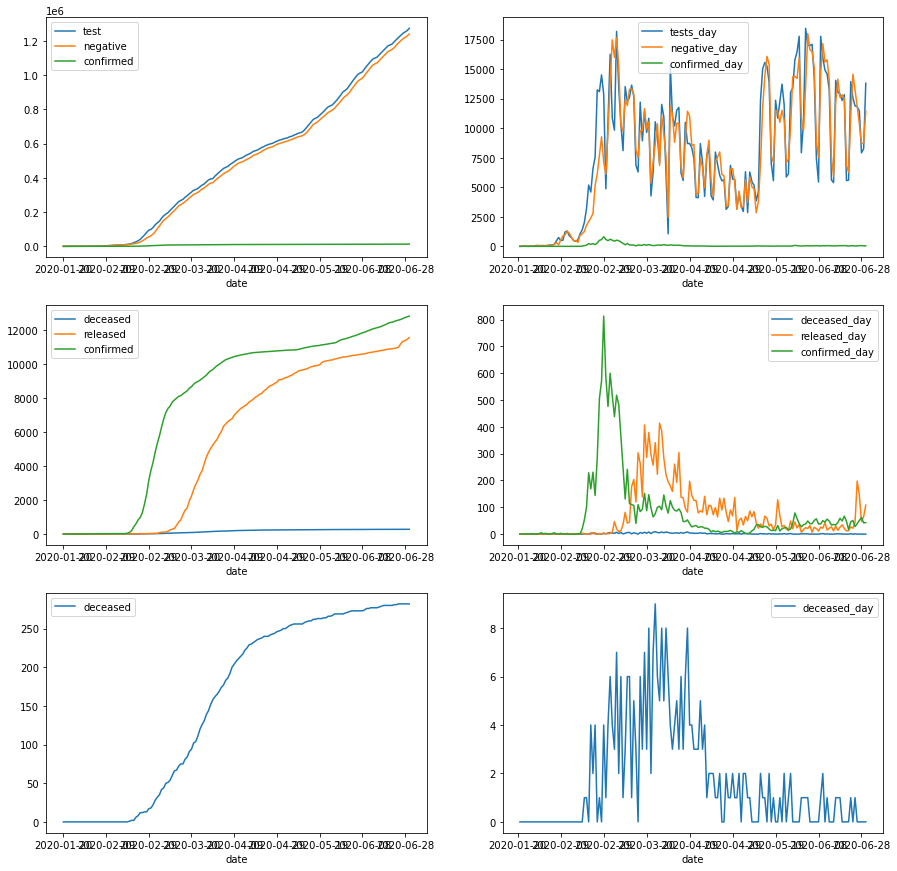

In [2]:
time_df = pd.read_csv('./data/Time.csv', index_col='date')

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15,15))

time_df[['test', 'negative', 'confirmed']].plot(ax=axes[0,0])
time_df[['deceased', 'released', 'confirmed']].plot(ax=axes[1,0])
time_df[['deceased']].plot(ax=axes[2,0])

time_df['tests_day'] = time_df['test'].diff()
time_df['negative_day'] = time_df['negative'].diff()
time_df['confirmed_day'] = time_df['confirmed'].diff()
time_df['released_day'] = time_df['released'].diff()
time_df['deceased_day'] = time_df['deceased'].diff()
time_df[['tests_day', 'negative_day', 'confirmed_day']].plot(ax=axes[0,1])

time_df[['deceased_day','released_day','confirmed_day']].plot(ax=axes[1,1])
time_df[['deceased_day']].plot(ax=axes[2,1])


This is good.  Let's see what else we can do with this data.

## Ratios

Let's convert the confirmed cases and deaths based on a ratio of tests and tests confirmed (respectively)

<AxesSubplot:title={'center':'#Confirmed:#Tests Ratio and #Deaths:#Confirmed Ratio'}, xlabel='date'>

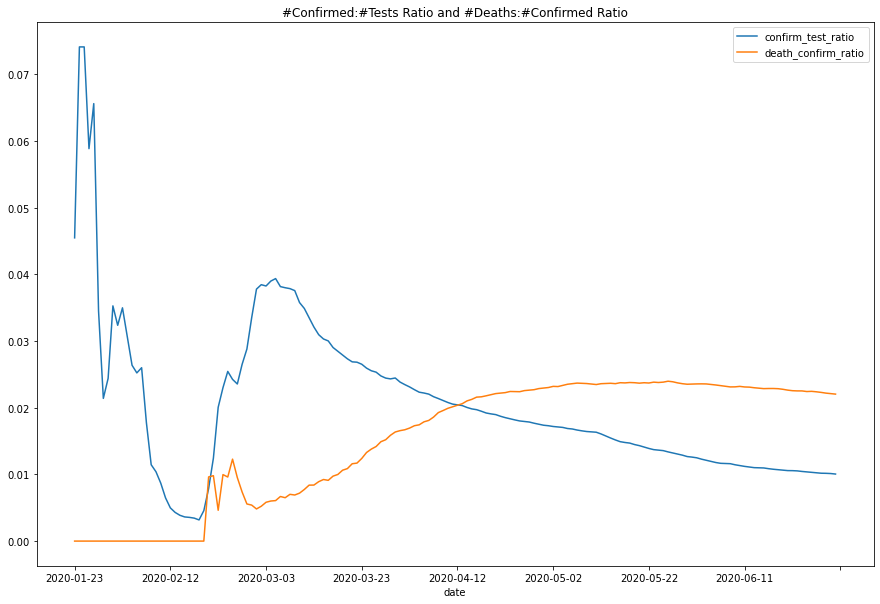

In [3]:
time_df['confirm_test_ratio'] = time_df['confirmed'] / time_df['test']
time_df['death_confirm_ratio'] = time_df['deceased'] / time_df['confirmed']
# Skip the first 3 days
time_df['2020-01-23':][['confirm_test_ratio','death_confirm_ratio']].plot(figsize=(15,10), title='#Confirmed:#Tests Ratio and #Deaths:#Confirmed Ratio')

## Outbreak
At the point the number of cases drastically increases to the point it starts to drop off, we'll call that the "outbreak".  Let's look at that a little more closely.

<AxesSubplot:xlabel='date'>

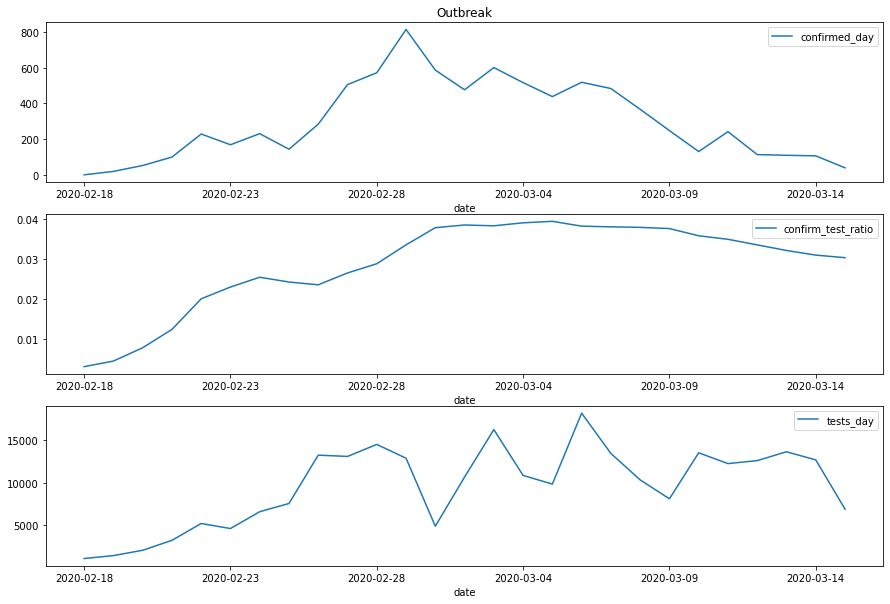

In [4]:
outbreak = time_df['2020-02-18':'2020-03-15']
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(15,10))

outbreak[['confirmed_day']].plot(ax=axes[0], title='Outbreak')
outbreak[['confirm_test_ratio']].plot(ax=axes[1])
outbreak[['tests_day']].plot(ax=axes[2])

We can see the number of tests drastically increases in-line with the number of confirmed cases.  This could mean we had more cases than were being tested for.  However, the confirm-test-ratio does set our mind at ease a bit and suggests that perhaps that wasn't necessarily the case.

Let's look at some new data.

## Policies

Let's first look at what policies were implemented during the outbreak.

In [5]:
policy_df = pd.read_csv('./data/Policy.csv')
policy_df['start_date'] = pd.to_datetime(policy_df['start_date'], format='%Y-%m-%d')
policy_df['end_date'] = pd.to_datetime(policy_df['end_date'], format='%Y-%m-%d')
policy_df[(policy_df['start_date'] >= '2020-02-18') & (policy_df['start_date'] < '2020-03-15')].sort_values('start_date')

,policy_id,country,type,gov_policy,detail,start_date,end_date
3,4,Korea,Alert,Infectious Disease Alert Level,Level 4 (Red),2020-02-23,NaT
24,25,Korea,Health,Drive-Through Screening Center,by Local Government,2020-02-26,NaT
22,23,Korea,Health,Emergency Use Authorization of Diagnostic Kit,4th EUA,2020-02-27,NaT
21,22,Korea,Health,Emergency Use Authorization of Diagnostic Kit,3rd EUA,2020-02-27,NaT
26,27,Korea,Health,Mask Distribution,Public-Sale,2020-02-27,NaT
28,29,Korea,Social,Social Distancing Campaign,Strong,2020-02-29,2020-03-21
33,34,Korea,Education,School Closure,Daycare Center for Children,2020-03-02,NaT
34,35,Korea,Education,School Opening Delay,Kindergarten,2020-03-02,2020-04-06
35,36,Korea,Education,School Opening Delay,High School,2020-03-02,2020-04-06
36,37,Korea,Education,School Opening Delay,Middle School,2020-03-02,2020-04-06


The above policies were the ones that were implemented during the outbreak mentioned in the previous graphs.  Let's look at how the different policies might have affected the number of new cases.

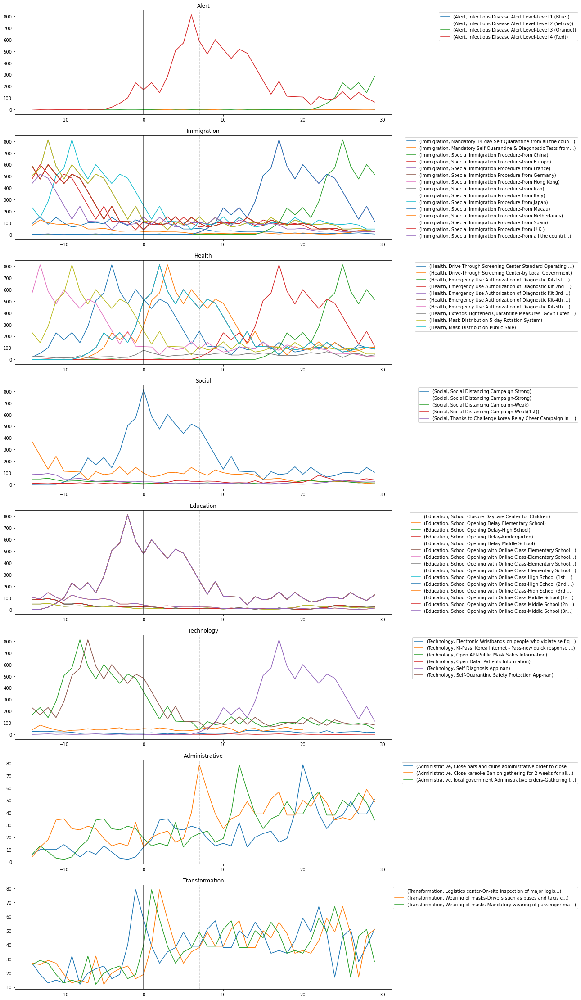

In [6]:
policy_df['policy'] = policy_df.apply(lambda x: str(x['gov_policy']) + '-' + str(x['detail']), axis=1)
policy_df['policy'] = policy_df['policy'].apply(lambda x: x[:50] + '...' if len(x) > 50 else x)
new_cases = time_df['confirmed_day']
new_cases.index = pd.to_datetime(new_cases.index)
policy_df['start_date'] = pd.to_datetime(policy_df['start_date'])

dates=(-14,30)

for i in range(*dates):
    policy_df[i] = policy_df.apply(lambda x: new_cases[x.start_date+datetime.timedelta(days=i)] if (x.start_date+datetime.timedelta(days=i)) in time_df['confirmed_day'].index else np.NaN, axis=1)
policy_df.head()

types = policy_df.type.unique()
fig, axes = plt.subplots(nrows=len(types), ncols=1, figsize=(15,5*len(types)))
policy_plot_df = policy_df.set_index(['type','policy'])[[x for x in range(*dates)]]

# Added sort_index to remove lexsort performance warning
policy_plot_df = policy_plot_df.sort_index().T

for i,t in enumerate(types):
    policy_plot_df[[t]].plot(ax=axes[i], title=t)
    axes[i].legend(loc='upper right', bbox_to_anchor=(1.5, 1))
    axes[i].axvline(x=0, ymin=0.0, ymax=1000.0, color='k', linestyle='-', alpha=0.7)
    axes[i].axvline(x=7, ymin=0.0, ymax=1000.0, color='k', linestyle='--', alpha=0.2)

While it does look like some policies might have helped this is an oversimplification.  Still interesting.

In [7]:
# Thist creates a df marking the days past/future of the policy start date - not used

# policy_time_df = time_df[['confirmed_day']].copy()
# policy_time_df.reset_index(inplace=True)
# policy_time_df['date'] = pd.to_datetime(policy_time_df['date'])
# for i, row in policy_df.iterrows():
#     policy_time_df[i] = policy_time_df.date-row.start_date
# display(policy_time_df.head())
# pol = 'Special Immigration Procedure-from Hong Kong'
# policy_time_df[policy_time_df[pol] == datetime.timedelta(days=-15)]['confirmed_day']

## Age

Let's see how age impacts our numbers.

<AxesSubplot:title={'center':'Deceased by Age Group'}, xlabel='date'>

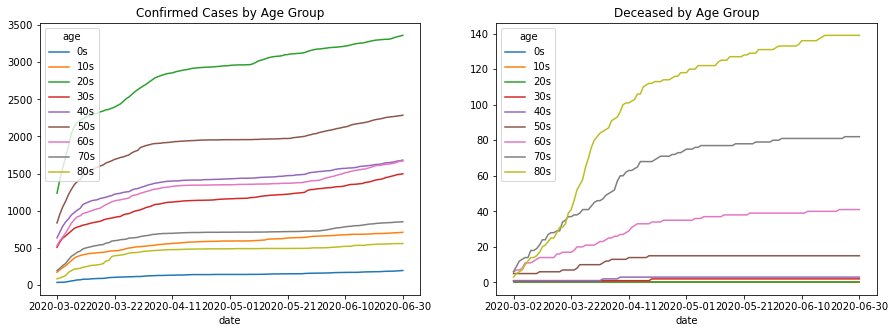

In [8]:
age_df = pd.read_csv('./data/TimeAge.csv', index_col='date')

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15,5))

age_df = age_df.pivot(columns='age',values=['confirmed','deceased'])
age_df['confirmed'].plot(ax=axes[0], title='Confirmed Cases by Age Group')
age_df['deceased'].plot(ax=axes[1], title='Deceased by Age Group')

Now this is interesting.  We can definitely see some age groups having higher numbers of cases which does not align with the number of deaths.  This suggests that age likely plays a role in death.

Let's check gender next.

## Gender

<AxesSubplot:title={'center':'Deceased by Day by Gender'}, xlabel='date'>

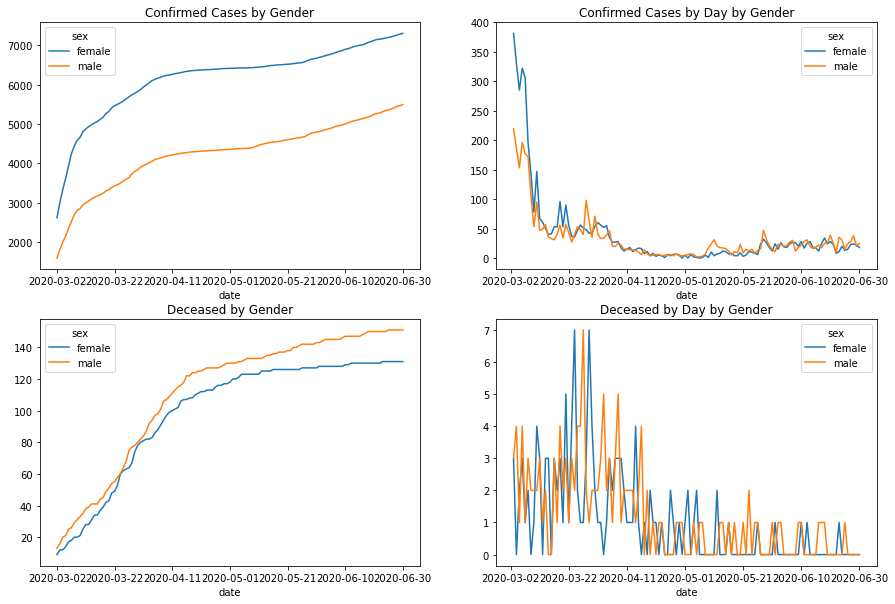

In [9]:
gender_df = pd.read_csv('./data/TimeGender.csv', index_col='date')

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15,10))

gender_df['confirmed_day'] = gender_df['confirmed'].diff(periods=2)
gender_df['deceased_day'] = gender_df['deceased'].diff(periods=2)

gender_df = gender_df.pivot(columns='sex',values=['confirmed','deceased','confirmed_day', 'deceased_day'])

gender_df['confirmed'].plot(ax=axes[0,0], title='Confirmed Cases by Gender')
gender_df['deceased'].plot(ax=axes[1,0], title='Deceased by Gender')
gender_df['confirmed_day'].plot(ax=axes[0,1], title='Confirmed Cases by Day by Gender')
gender_df['deceased_day'].plot(ax=axes[1,1], title='Deceased by Day by Gender')

The confirmed cases are higher for women than men and yet men seem to be more likely to be severely impacted.  I wonder why this is.  Perhaps the high number of women are nursing staff and the high number of male deaths are elderly patients.

## Province
Let's look at this by province to see if we can spot anything interesting.

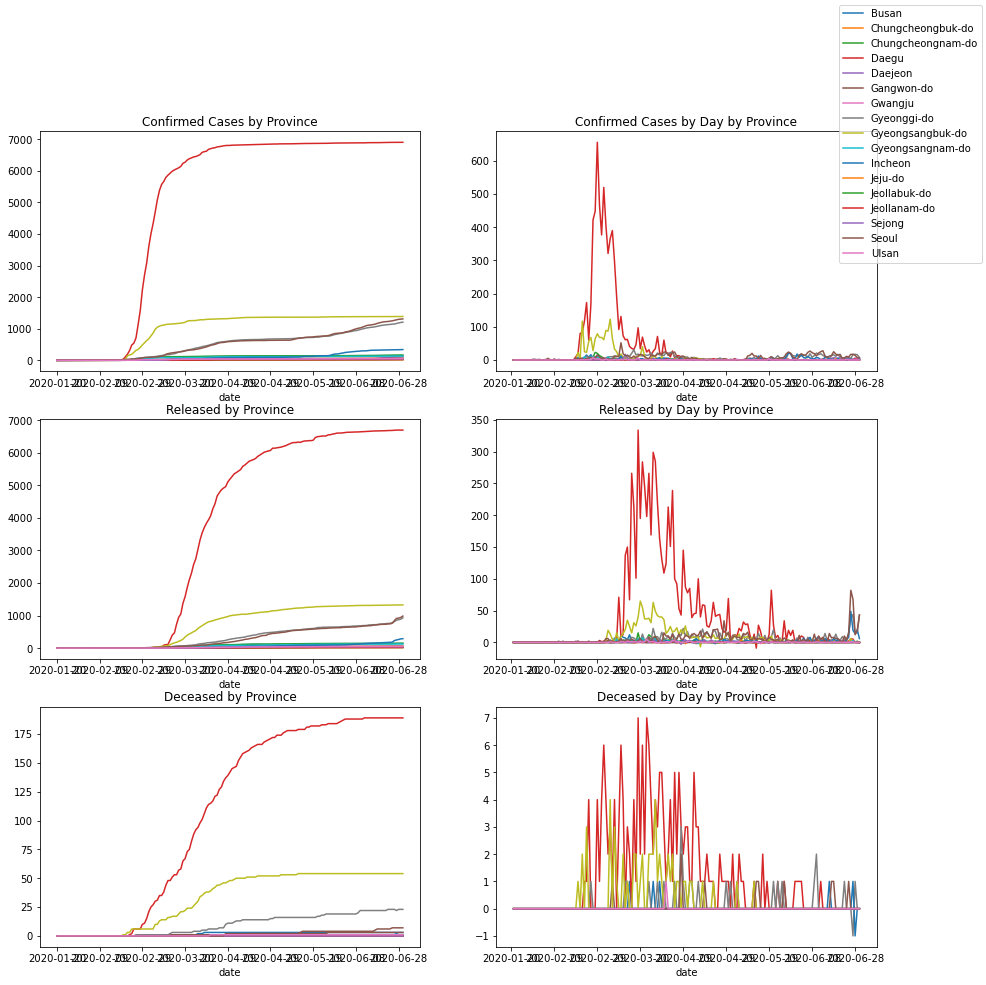

In [10]:
prov_df = pd.read_csv('./data/TimeProvince.csv', index_col='date')

prov_df.groupby(level=0).count().max()  # even though different times, each date has only 17 entries (one for each province)

# Not necessary to sort since it's already sorted
#prov_df = prov_df.reset_index().sort_values(by=['date','province']).set_index('date')

prov_df['confirmed_day'] = prov_df['confirmed'].diff(periods=17)
prov_df['released_day'] = prov_df['released'].diff(periods=17)
prov_df['deceased_day'] = prov_df['deceased'].diff(periods=17)

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15,15))

prov_piv_df = prov_df.pivot(columns='province',values=['confirmed','released','deceased','confirmed_day','released_day','deceased_day'])

prov_piv_df['confirmed'].plot(ax=axes[0,0], title='Confirmed Cases by Province', legend=False)
prov_piv_df['released'].plot(ax=axes[1,0], title='Released by Province', legend=False)
prov_piv_df['deceased'].plot(ax=axes[2,0], title='Deceased by Province', legend=False)
prov_piv_df['confirmed_day'].plot(ax=axes[0,1], title='Confirmed Cases by Day by Province', legend=False)
prov_piv_df['released_day'].plot(ax=axes[1,1], title='Released by Day by Province', legend=False)
prov_piv_df['deceased_day'].plot(ax=axes[2,1], title='Deceased by Day by Province', legend=False)

# Paint the lenged only once (same for all)
handles, labels = axes[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')

Wow. Look at Dengu.  That seems to be the epicenter of corona cases in Korea.  Let's see if we can visualize this better.

### Cumulative confirmed counts by province

In [11]:
sk_geo = f'https://raw.githubusercontent.com/southkorea/southkorea-maps/master/gadm/json/skorea-provinces-geo.json'

m = folium.Map(location=[36.68328834126775, 127.99282689627246], zoom_start=7)

folium.Choropleth(
    geo_data=sk_geo,
    name='cholorpleth',
    data=prov_df['2020-06-30':'2020-06-30'],
    columns=['province','confirmed'],
    key_on='properties.NAME_1',
    fill_color='RdBu_r',
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name='Total Cases as of 2020-06-30',
    reset=True
).add_to(m)

m

### Cumulative confirmed counts by province during outbreak

In [12]:
# Look at the data during the "outbreak"
with urlopen(sk_geo) as response:
    provinces = json.load(response)

fig = px.choropleth(prov_df['2020-02-18':'2020-03-15'].reset_index(),
                    geojson=provinces,
                    locations='province',
                    color='confirmed',
                    color_continuous_scale="Bluered",
                    scope="asia",
                    featureidkey='properties.NAME_1',
                    animation_frame='date'
                   )
fig.update_geos(fitbounds="locations")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Okay, that was really slow....

For fun, we'll make a little gif animating the above image.

In [13]:
import gif

with urlopen(sk_geo) as response:
    provinces = json.load(response)
    
@gif.frame
def make_gif(built_df, dt):

    fig = px.choropleth(built_df[dt:dt].reset_index(),
                    geojson=provinces,
                    locations='province',
                    color='confirmed',
                    color_continuous_scale="Bluered",
                    scope="asia",
                    featureidkey='properties.NAME_1'
                   )
    fig.update_geos(fitbounds="locations")
    fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
    
    return fig

built_df = prov_df['2020-02-18':'2020-03-15']

frames = []
for dt in built_df.index.unique():
    frame = make_gif(built_df, dt)
    frames.append(frame)
gif.save(frames, './korea.gif', duration=100)